# IMnCV-2024-2 (CP412005) Final Lab Exam

This lab exam consists of **three types** of questions:

> (ข้อสอบทั้งหมดจะประกอบไปด้วยคำถาม 3 ประเภท :)

- 3-Mark Questions (ข้อละ 3 คะแนน)
- 5-Mark Questions (ข้อละ 5 คะแนน)
- 8-Mark Questions (ข้อละ 8 คะแนน)

There are a total of 8 questions available.
> (จะมีข้อสอบอยู่ทั้งหมด 8 ข้อด้วยกัน )

**Your Mission:** (ข้อกำหนดการทำข้อสอบ)
- You must complete at least 10 marks by selecting and answering the appropriate questions.
> (นักศึกษาจะต้องทำข้อสอบให้คะแนนรวมทั้งหมดได้ 10 คะแนนขึ้นไป โดยสามารถเลือกทำข้อสอบจากทั้งหมด 8 ข้อตามที่มีคะแนนแตกต่างกันในแต่ละคำถาม) **ไม่จำเป็นต้องทำครบทุกข้อ

**Important**:(สำคัญ)

- You must fully complete all required questions as specified. 
> (เมื่อเลือกทำคำถามข้อใดแล้ว ให้ทำให้ครบตามความต้องการของคำถามนั้นๆ ให้สมบูรณ์ หรือตอบคำถามในข้อนั้นๆให้สมบูรณ์)
- Partial answers will result in zero points. 
> (หากตอบคำถามไม่ครบในข้อนั้นนั้นที่เลือกจะถือว่าได้ 0 คะแนน)


# Quesion 1 (3 Marks) | คำถามข้อที่ 1 ( 3 คะแนน)

**Module Implementation from Scratch Task: | โจทย์ ให้สร้างโมดูลด้วยตนเองตามโจทย์**

Task Description: Manually implement the Squeeze-and-Excitation (SE) Block in PyTorch and test it using a given dummy input.
> รายละเอียดโจทย์ : ให้ทำการสร้าง SE Block ด้วยตนเอง โดยใช้ PyTorch และทำการทดสอบบล็อกด้วย input จำลอง



**Instructions: | คำสั่ง:**
1. Write the SE Block: (เขียน SE Block)
    - Implement the SE Block as a PyTorch module. <span style="color: #E67E22;">(สร้าง SE Block เป็นโมดูลของ PyTorch)</span> 
    - Ensure it includes the Global Average Pooling (GAP) layer, fully connected (FC) layers, ReLU, Sigmoid activation, and element-wise multiplication as shown in the diagram. <span style="color: #E67E22;">(ตรวจสอบให้แน่ใจว่า Block นี้จะประกอบด้วย GAP, FC, ReLU, Sigmoid activation, การคูณแบบ element-wise หรือการคูณทีละตำแหน่งตามที่แสดงในไดอะแกรมของโจทย์)</span> 

2. Test with a Dummy Input (Note: The output shape should be the same as the input.) <span style="color: #E67E22;">(ทดสอบกับ input จำลอง **หมายเหตุ: ขนาดของผลลัพธ์ควรจะเท่ากับขนาดของ input)</span> 

**Deliverables: | ผลลัพธ์ที่ต้องแสดง**
- PyTorch implementation of SEBlock2D. <span style="color: #E67E22;">(สร้าง SEBlock 2 มิติ ด้วย PyTorch )</span> 

- A test script using the given dummy input. <span style="color: #E67E22;">(ทดสอบโมดูลที่สร้างกับ input จำลอง)</span> 

- Printed output showing: <span style="color: #E67E22;">(แสดงตัวอย่างผลลัพธ์ตามนี้)</span> 

Input Shape: torch.Size([1, 64, 32, 32])

Output Shape: torch.Size([1, 64, 32, 32])


![QUESTION 1 SE BLOCK PICTURE.png](<attachment:QUESTION 1 SE BLOCK PICTURE.png>)
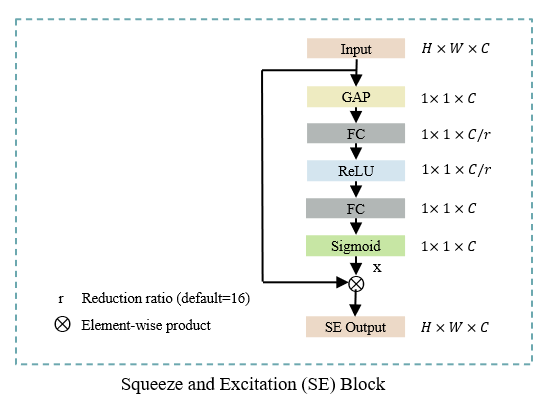

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os
import torch.nn.functional as F

1. Write the SE Block (เขียน SE Block)

In [ ]:
# Answer your code here | ตอบ
class SEBlock2D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(SEBlock2D, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(1, 1)
        self.relu = nn.ReLU(inplace=True)
        self.fc = nn.Linear(1, 1)
        

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        if self.downsample is not None:
            identity = self.downsample(x)
        out += identity  # Skip connection
        out = self.relu(out)
        return out

2. Test your SE Block by this following input and code (ทดสอบโมดูล SE Block ที่สร้างกับ input จำลอง และโค้ดที่เตรียมไว้ให้)

In [ ]:
# Test with these codes
dummy_input = torch.randn(1, 64, 32, 32)  # (batch, channels, height, width)
se_block = SEBlock2D(in_channels=64)
output = se_block(dummy_input)

# Print your output
print("Input Shape:", dummy_input.shape)
print("Output Shape::", output.shape)

# Quesion 2 (3 Marks) | คำถามข้อที่ 2 (3 คะแนน)

**Skin Smoothing Task (โจทย์ การปรับภาพให้ผิวเรียบเนียน):**


Task Description: Apply a smoothing filter to enhance skin appearance, similar to beauty filters in camera apps while preserving edges in the given image. （A sample of smoothed image is given)
> รายละเอียดโจทย์: ให้นักศึกษาทำการใช้ smoothing filter เพื่อปรับให้ผิวของรูปภาพต้นฉบับมีความเรียบเนียน เสมือนเราใช้ฟิลเตอร์ความงามในแอปกล้องถ่ายรูป แต่ยังคงต้องเก็บรักษาบริเวณขอบของแต่ละส่วนในภาพ (ผิวเรียบเนียน แต่ขอบคมชัดเหมือนเดิม)

**Instructions (คำสั่ง):**

1. Read the provided **"QUESTION2_INPUT.jpeg"**  image. <span style="color: #E67E22;">(ทำการอ่าน input รูปภาพชื่อ **"QUESTION2_INPUT.jpeg"** )</span>
>  [You may apply image scaling before processing the task. <span style="color: #E67E22;">(นักศึกษาอาจจะต้องทำการปรับสเกล หรือขนาดของรูปภาพก่อนที่จะทำในขั้นตอนต่อไป)</span> ]
2. Apply smoothing with appropriate parameters. <span style="color: #E67E22;">(ทำการใช้ Smoothing โดยการกำหนดพารามิเตอร์ให้เหมาะสม)</span>
3. Display and compare the original image and the filtered image side by side. <span style="color: #E67E22;">(แสดงผล และเปรียบเทียบผลลัพธ์ระหว่างรูปภาพต้นฉบับกับรูปภาพที่ได้จากการใช้ smoothing filter)</span>

**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- A visual comparison between the original image and the smoothed output. <span style="color: #E67E22;">(ภาพที่เปรียบเทียบกันระหว่างภาพต้นฉบับ และภาพที่ได้จากการทำ smoothing)</span>



![QUESTION 2 RESULT SAMPLE PICTURE.jpg](<attachment:QUESTION 2 RESULT SAMPLE PICTURE.jpg>)

A sample of smoothed image | ตัวอย่างภาพที่ได้จากการทำ smoothing
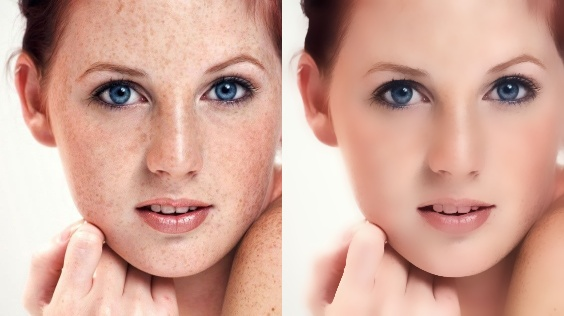

In [8]:
import cv2
import numpy  as np

In [10]:
import matplotlib.pyplot as plt

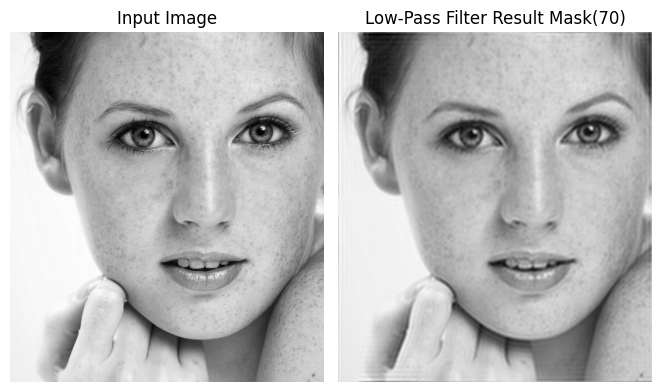

error: OpenCV(4.11.0) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::impl::`anonymous namespace'::Set<1,-1,-1>,struct cv::impl::A0x34dd5b3e::Set<3,4,-1>,struct cv::impl::A0x34dd5b3e::Set<0,2,5>,4>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)


In [ ]:
# Answer your code here | ตอบ
face= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION2_INPUT.jpeg')
face_gray = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)

f = np.fft.fft2(face_gray)
fshift = np.fft.fftshift(f)

for i, mask_size in enumerate([70], 1):
  # Low pass filter
  rows, cols = face_gray.shape
  crow, ccol = rows//2, cols//2

  mask = np.zeros((rows, cols), dtype=np.uint8)
  mask[crow-mask_size:crow+mask_size, ccol-mask_size:ccol+mask_size] = 1

  fshift_low_pass = fshift * mask

  f_ishift = np.fft.ifftshift(fshift_low_pass)
  img_back_lowpass = np.fft.ifft2(f_ishift)
  img_back_lowpass = np.real(img_back_lowpass)

  plt.figure(figsize=(10, 10))

  plt.subplot(i, 3, 1)
  plt.imshow(face_gray, cmap='gray')
  plt.title('Input Image')
  plt.axis('off')

  plt.subplot(i, 3, 2)
  plt.imshow(img_back_lowpass, cmap='gray')
  plt.title(f'Low-Pass Filter Result Mask({mask_size})')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

plt.show()


# Quesion 3 (3 Marks) | คำถามข้อที่ 3 (3 คะแนน)

**Multi-Image Panorama Construction Task (โจทย์ การสร้างภาพพาโนรามาจากภาพหลายๆ รูป):**


Task Description: Combine 6 images of beach view images to show last output result in panorama style. (A sample of completed image is given)
> รายละเอียดโจทย์: ให้นักศึกษาทำการรวมภาพ 6 ภาพ ซึ่งเป็นวิวของชายทะเล ให้แสดงผลลัพธ์อยู่ในรูปแบบของพาโนรามา

**Instructions (คำสั่ง):**

1. Read the provided **"QUESTION3_INPUT1.jpg, QUESTION3_INPUT2.jpg, QUESTION3_INPUT3.jpg, QUESTION3_INPUT4.jpg, QUESTION3_INPUT5.jpg, QUESTION3_INPUT6.jpg"**  image. <span style="color: #E67E22;">(อ่านข้อมูลภาพทั้งหมด 6 ภาพชื่อ **"QUESTION3_INPUT1.jpg, QUESTION3_INPUT2.jpg, QUESTION3_INPUT3.jpg, QUESTION3_INPUT4.jpg, QUESTION3_INPUT5.jpg, QUESTION3_INPUT6.jpg"**)</span> 
2. Follow step of combining 6 images by using image stitching theory solution. <span style="color: #E67E22;">(ทำการรวมทั้ง 6 ภาพโดยการใช้ทฤษฎี และวิธีการของ image stitching)</span> 
> [**Not allow to use "stitcher" object from opencv <span style="color: #E67E22;">( **หมายเหตุ: ห้ามนักศึกษาใช้ stitcher จาก OpenCV)</span> ] 
3. Use cropping and blending image if need to show your completely result. <span style="color: #E67E22;">(ทำการตัดขอบ และใช้วิธีผสมผสานขอบ/blending ภาพเพื่อให้ได้ผลลัพธ์ที่สมบูรณ์แบบ)</span> 
4. Display your final result. <span style="color: #E67E22;">(แสดงผลลัพธ์ที่เสร็จเรียบร้อย)</span> 

**Deliverable | ผลลัพธ์ที่ต้องแสดง:**
- A complete result of 6 images in panorama view. <span style="color: #E67E22;">(ผลลัพธ์ที่สมบูรณ์แบบในการรวม 6 ภาพเป็นวิวพาโนรามา 1 ภาพใหญ่)</span> 


![QUESTION 3 RESULT SAMPLE PICTURE.png](<attachment:QUESTION 3 RESULT SAMPLE PICTURE.png>)

A sample of completed image | ตัวอย่างผลลัพธ์
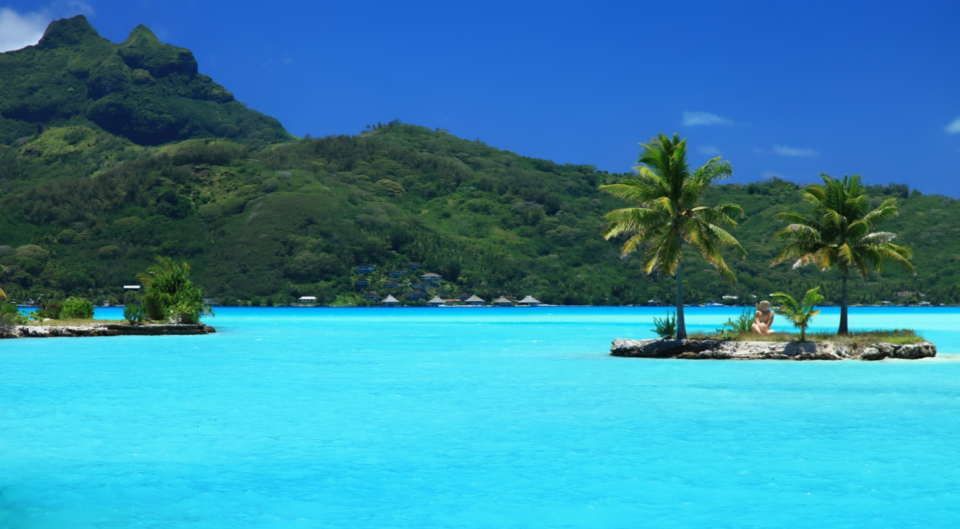

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [11]:
def display_images(images):

    #Check that image is list type or not.
    if not isinstance(images, list):
        #If not list type
        figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(images, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
        plt.axis('off')
        return

    n = len(images)
    # cols = int(np.ceil(np.sqrt(n)))
    cols = 2
    rows = int(np.ceil(n / cols))
    print("n = ",n)
    print("cols = ",cols)
    print("rows = ",rows)

    fig, axes = plt.subplots(rows, cols, figsize=(12, 12))
    print("axes before: ",len(axes))
    axes = axes.flatten()  # Flatten the axes array for easier indexing
    print("axes after: ",len(axes))

    for i in range(n):
        axes[i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
        axes[i].axis('off') #hide axis


    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [10]:
img1= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT1.jpg')
img2= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT2.jpg')
img3= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT3.jpg')
img4= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT4.jpg')
img5= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT5.jpg')
img6= cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION3_INPUT6.jpg')


n =  6
cols =  2
rows =  3
axes before:  3
axes after:  6


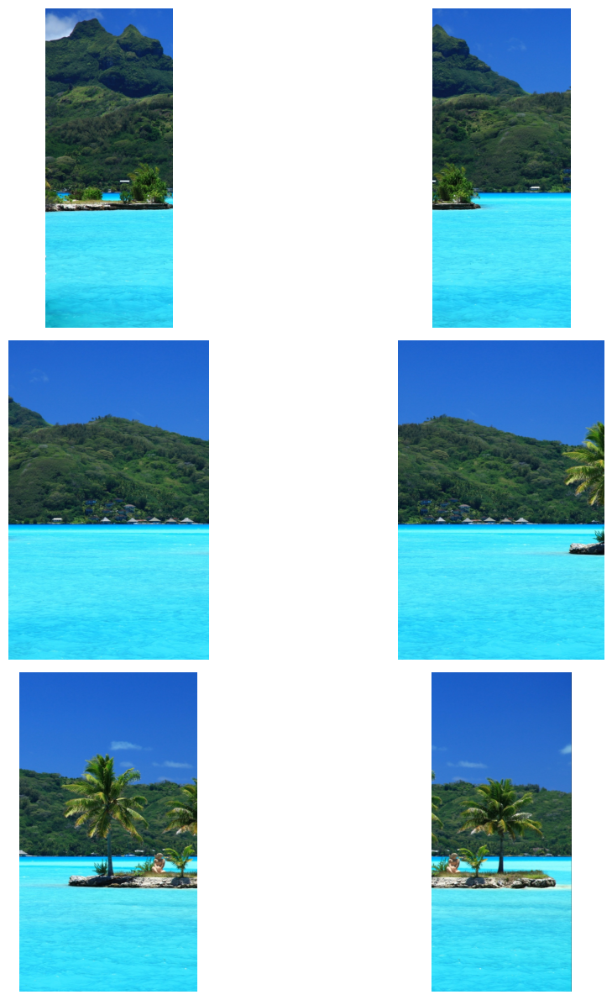

In [11]:
display_images([img1,img2,img3,img4,img5,img6])

In [12]:
# Create SIFT object
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)
keypoints3, descriptors3 = sift.detectAndCompute(img3, None)
keypoints4, descriptors4 = sift.detectAndCompute(img4, None)
keypoints5, descriptors5 = sift.detectAndCompute(img5, None)
keypoints6, descriptors6 = sift.detectAndCompute(img6, None)


In [13]:
bf = cv2.BFMatcher()
matches_1_2 = bf.knnMatch(descriptors1, descriptors2, k=2)
good_matches_1_2 = []
for m, n in matches_1_2:
  if m.distance < 0.75 * n.distance:
    good_matches_1_2.append([m])

limit = 50

src_pts = np.float32([ keypoints1[m[0].queryIdx].pt for m in good_matches_1_2 ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints2[m[0].trainIdx].pt for m in good_matches_1_2 ]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
good_matches_ransac = [good_matches_1_2[i] for i in range(len(good_matches_1_2)) if mask[i]]
good_matches_ransac_top_1_2 = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]

In [14]:
selected_good_matches=good_matches_ransac_top_1_2
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints1[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints2[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))

In [24]:
def create_mask(query_image, train_image, version):
        smoothing_window_percent = 0.10 # consider increasing or decreasing[0.00, 1.00]
        width_query_photo = query_image.shape[1]
        width_train_photo = train_image.shape[1]
        lowest_width = min(width_query_photo, width_train_photo)
        smoothing_window_size = max(100, min(smoothing_window_percent * lowest_width, 1000))

        height_query_photo = query_image.shape[0]
        height_panorama = height_query_photo
        width_panorama = width_query_photo + width_train_photo

        offset = int(smoothing_window_size / 2)
        barrier = query_image.shape[1] - int(smoothing_window_size / 2)
        mask = np.zeros((height_panorama, width_panorama))
        if version == "left_image":
            mask[:, barrier - offset : barrier + offset] = np.tile(
                np.linspace(1, 0, 2 * offset).T, (height_panorama, 1)
            )
            mask[:, : barrier - offset] = 1
        else:
            mask[:, barrier - offset : barrier + offset] = np.tile(
                np.linspace(0, 1, 2 * offset).T, (height_panorama, 1)
            )
            mask[:, barrier + offset :] = 1
        return cv2.merge([mask, mask, mask])

In [22]:
def blending_smoothing(query_image, train_image, homography_matrix):
        height_img1 = query_image.shape[0]
        width_img1 = query_image.shape[1]
        width_img2 = train_image.shape[1]
        height_panorama = height_img1
        width_panorama = width_img1 + width_img2

        panorama1 = np.zeros((height_panorama, width_panorama, 3))
        mask1 = create_mask(query_image, train_image, version="left_image")
        panorama1[0 : query_image.shape[0], 0 : query_image.shape[1], :] = query_image
        panorama1 *= mask1
        mask2 = create_mask(query_image, train_image, version="right_image")
        panorama2 = (
            cv2.warpPerspective(
                train_image, homography_matrix, (width_panorama, height_panorama)
            )
            * mask2
        )
        result = panorama1 + panorama2

        # remove extra blackspace
        rows, cols = np.where(result[:, :, 0] != 0)
        min_row, max_row = min(rows), max(rows) + 1
        min_col, max_col = min(cols), max(cols) + 1

        final_result = result[min_row:max_row, min_col:max_col, :]

        return final_result

In [18]:
img1.shape, img2.shape

((768, 306, 3), (768, 332, 3))

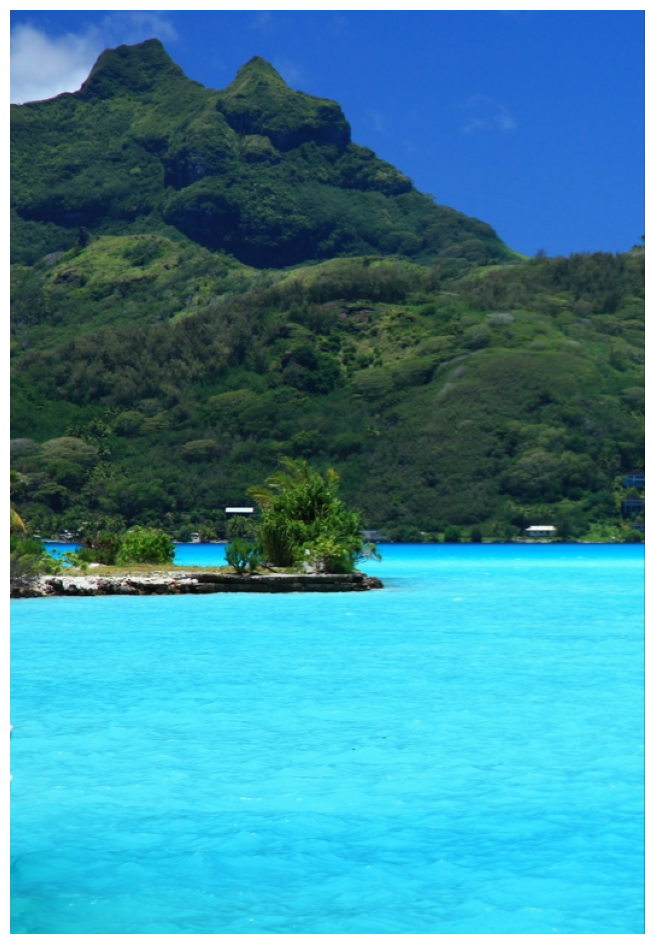

In [25]:
result = blending_smoothing(img1, img2, H)
result2 = np.uint8(result)
display_images(result2)

(768, 807, 3)


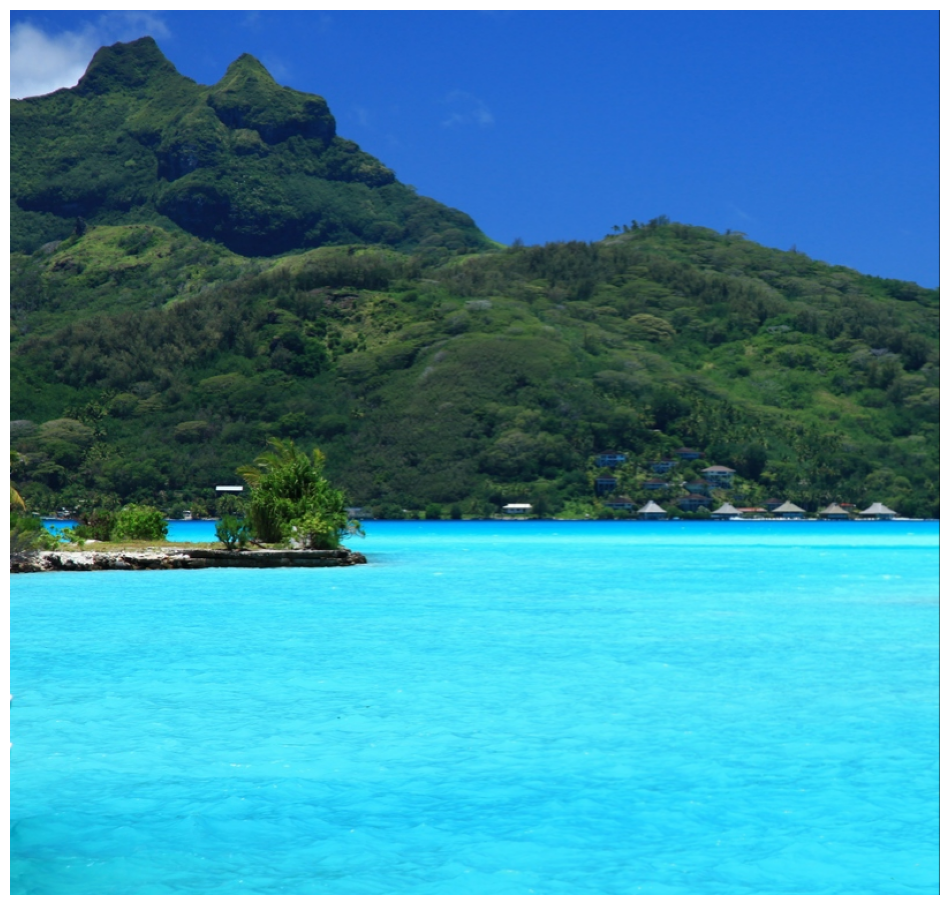

In [27]:
keypoints_1_2, descriptors_1_2 = sift.detectAndCompute(result2, None)
matches_1_2_3 = bf.knnMatch(descriptors_1_2, descriptors3, k=2)
good_matches_1_2_3 = []
for m, n in matches_1_2_3:
  if m.distance < 0.75 * n.distance:
    good_matches_1_2_3.append([m])
src_pts = np.float32([ keypoints_1_2[m[0].queryIdx].pt for m in good_matches_1_2_3 ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints3[m[0].trainIdx].pt for m in good_matches_1_2_3 ]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
good_matches_ransac = [good_matches_1_2_3[i] for i in range(len(good_matches_1_2_3)) if mask[i]]
good_matches_ransac_top_1_2_3 = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
selected_good_matches=good_matches_ransac_top_1_2_3
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints_1_2[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints3[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result = blending_smoothing(result2, img3, H)
result3 = np.uint8(result)
print(result3.shape)
display_images(result3)

(768, 954, 3)


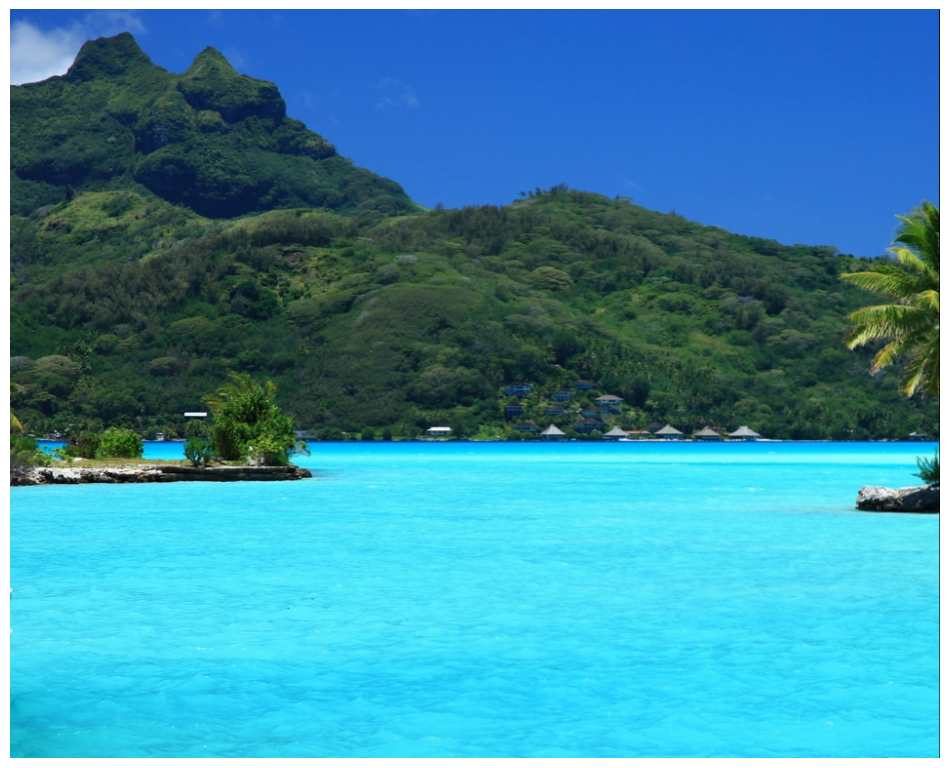

In [ ]:
keypoints_1_2_3, descriptors_1_2_3 = sift.detectAndCompute(result3, None)
matches_1_2_3_4 = bf.knnMatch(descriptors_1_2_3, descriptors4, k=2)
good_matches_1_2_3_4 = []
for m, n in matches_1_2_3_4:
  if m.distance < 0.75 * n.distance:
    good_matches_1_2_3_4.append([m])
src_pts = np.float32([ keypoints_1_2_3[m[0].queryIdx].pt for m in good_matches_1_2_3_4 ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints4[m[0].trainIdx].pt for m in good_matches_1_2_3_4 ]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
good_matches_ransac = [good_matches_1_2_3_4[i] for i in range(len(good_matches_1_2_3_4)) if mask[i]]
good_matches_ransac_top_1_2_3 = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
selected_good_matches=good_matches_ransac_top_1_2_3
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints_1_2_3[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints4[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result = blending_smoothing(result3, img4, H)
result4 = np.uint8(result)
print(result4.shape)
display_images(result4)

(768, 1180, 3)


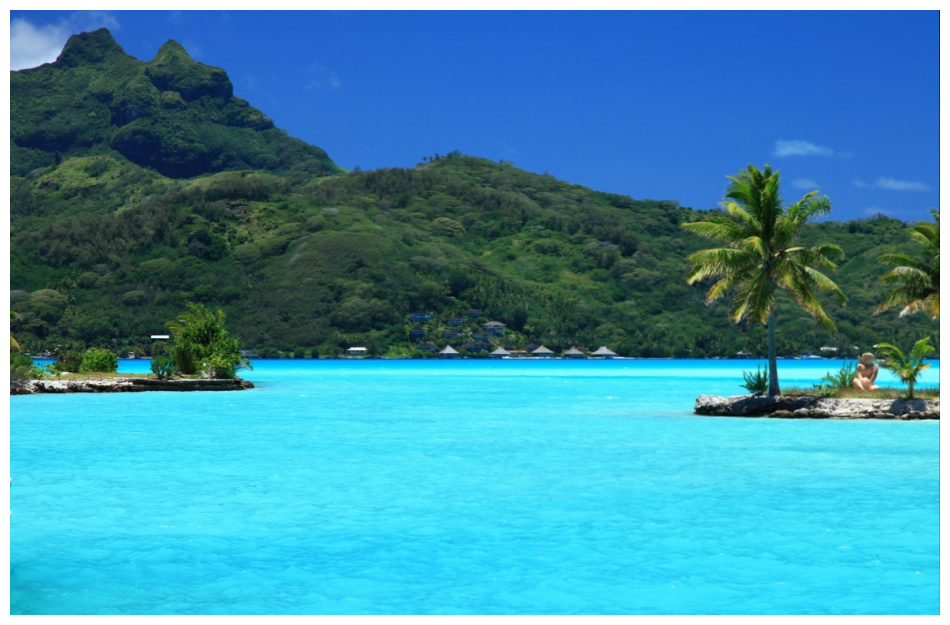

In [31]:
keypoints_1_2_3_4, descriptors_1_2_3_4 = sift.detectAndCompute(result4, None)
matches_1_2_3_4_5 = bf.knnMatch(descriptors_1_2_3_4, descriptors5, k=2)
good_matches_1_2_3_4_5 = []
for m, n in matches_1_2_3_4_5:
  if m.distance < 0.75 * n.distance:
    good_matches_1_2_3_4_5.append([m])
src_pts = np.float32([ keypoints_1_2_3_4[m[0].queryIdx].pt for m in good_matches_1_2_3_4_5 ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints5[m[0].trainIdx].pt for m in good_matches_1_2_3_4_5 ]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
good_matches_ransac = [good_matches_1_2_3_4_5[i] for i in range(len(good_matches_1_2_3_4_5)) if mask[i]]
good_matches_ransac_top_1_2_3 = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
selected_good_matches=good_matches_ransac_top_1_2_3
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints_1_2_3_4[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints5[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result = blending_smoothing(result4, img5, H)
result5 = np.uint8(result)
print(result5.shape)
display_images(result5)

(768, 1180, 3)


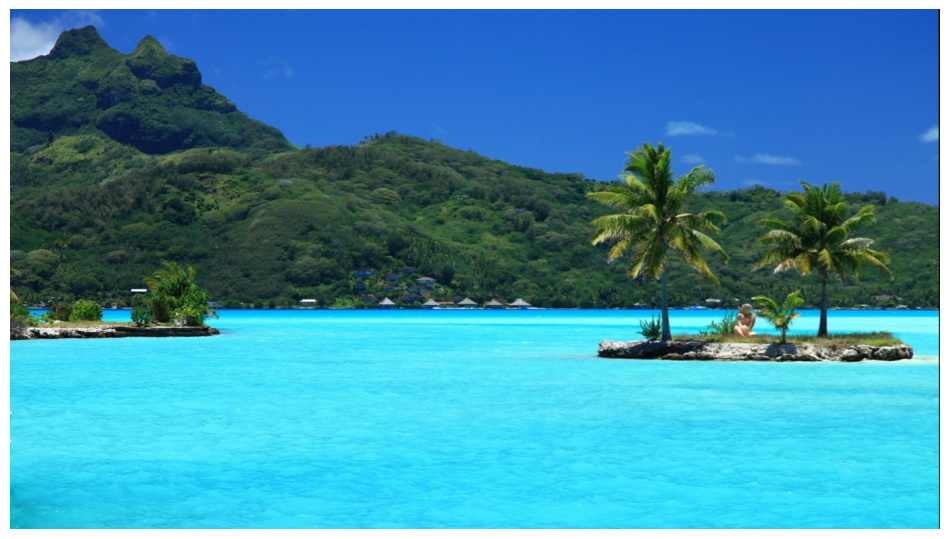

In [32]:
keypoints_1_2_3_4_5, descriptors_1_2_3_4_5 = sift.detectAndCompute(result5, None)
matches_1_2_3_4_5_6 = bf.knnMatch(descriptors_1_2_3_4_5, descriptors6, k=2)
good_matches_1_2_3_4_5_6 = []
for m, n in matches_1_2_3_4_5_6:
  if m.distance < 0.75 * n.distance:
    good_matches_1_2_3_4_5_6.append([m])
src_pts = np.float32([ keypoints_1_2_3_4_5[m[0].queryIdx].pt for m in good_matches_1_2_3_4_5_6 ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints6[m[0].trainIdx].pt for m in good_matches_1_2_3_4_5_6 ]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
good_matches_ransac = [good_matches_1_2_3_4_5_6[i] for i in range(len(good_matches_1_2_3_4_5_6)) if mask[i]]
good_matches_ransac_top_1_2_3 = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
selected_good_matches=good_matches_ransac_top_1_2_3
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints_1_2_3_4_5[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints6[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result = blending_smoothing(result5, img6, H)
result6 = np.uint8(result)
print(result5.shape)
display_images(result6)

In [34]:
result6.shape

(768, 1374, 3)

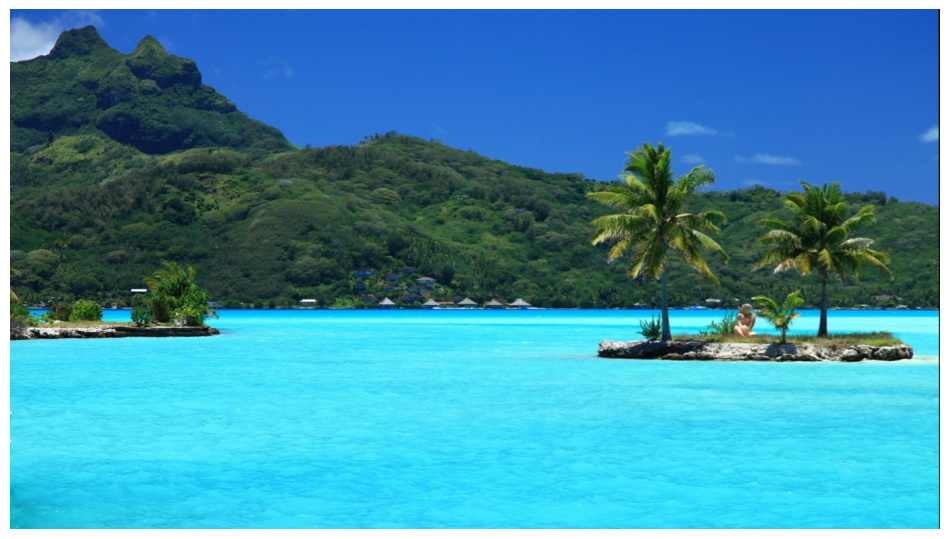

In [47]:
#Answer your code to show complete result of panorama here.  | ตอบเพื่อแสดงคำตอบที่ทำเสร็จสมบูรณ์
final_panorama_image = result6.copy()
# final_panorama_image = final_panorama_image[70:700, 70:1352]
display_images(final_panorama_image)

# Quesion 4 (3 Marks) | คำถามข้อที่ 4 (3 คะแนน)

**Convolutional Nueral Network Output Size Calculating Task (โจทย์ การคำนวณขนาดของผลลัพธ์ CNN):**


Task Description: Calculating output size of each layer in convolutional nueral network model.
> รายละเอียดโจทย์: คำนวณหาขนาดของผลลัพธ์ในแต่ละเลเยอร์ของ Network CNN ตามสมการการคำนวณ

**Instructions (คำสั่ง):**

1. Calculating output size of each layer in convolutional nueral network model following equations. <span style="color: #E67E22;">(คำนวณหาขนาดของผลลัพธ์ในแต่ละเลเยอร์ของ Network CNN ตามสมการการคำนวณ)</span> 
2. Fill result in blank block """Put your answer here Channel* Height * Width """ in Linear layer. <span style="color: #E67E22;">(เติมผลลัพธ์ที่คำนวณได้ลงในช่องว่างของชั้น Linear ในรูปแบบ Channel* Height * Width)</span> 
2. Show output size result of 2 layers of Conv and 1 layer of MaxPool. <span style="color: #E67E22;">(แสดงขนาดของผลลัพธ์ของชั้น Conv2d และ MaxPool หรือสามารถใช้การแสดงผลแบบ summary ตาม code ที่ได้เตรียมไว้ให้)</span> 

**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- Fill in the missing value in the nn.Linear(...) layer with the correct input size calculated <span style="color: #E67E22;">(เติมผลลัพธ์ที่คำนวณได้ลงในช่องว่างของชั้น nn.Linear(...)ด้วยผลลัพธ์ที่คำนวณมาอย่างถูกต้องในรูปแบบ Channel* Height * Width) </span> 
- Printed Output <span style="color: #E67E22;">(ปริ้นแสดงผลลัพธ์)</span> 

In [58]:
import torch
import torch.nn as nn
from torchsummary import summary

NUM_CLASSES = 5

convnet_sequential = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(inplace=True),
    nn.Conv2d(16, 32, kernel_size=3, padding=1),
    nn.ReLU(inplace=True),
    nn.MaxPool2d(kernel_size=3, stride=2),
    nn.Flatten(),
    nn.Dropout(),
    nn.Linear(32*55*55 , 1024),
    nn.ReLU(inplace=True),
    nn.Linear(1024, NUM_CLASSES)
)

In [59]:
# Show the output size with these codes | แสดงขนาดของผลลัพธ์ด้วย code นี้
summary(convnet_sequential, input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 112, 112]             448
              ReLU-2         [-1, 16, 112, 112]               0
            Conv2d-3         [-1, 32, 112, 112]           4,640
              ReLU-4         [-1, 32, 112, 112]               0
         MaxPool2d-5           [-1, 32, 55, 55]               0
           Flatten-6                [-1, 96800]               0
           Dropout-7                [-1, 96800]               0
            Linear-8                 [-1, 1024]      99,124,224
              ReLU-9                 [-1, 1024]               0
           Linear-10                    [-1, 5]           5,125
Total params: 99,134,437
Trainable params: 99,134,437
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 11.42
Params size (MB): 378.17
Es

# Quesion 5 (5 Marks) | คำถามข้อที่ 5 (5 คะแนน)

**Image Segmentation and Background Manipulation Task (โจทย์ การแบ่งส่วนของรูปภาพและการจัดการกับพื้นหลัง ภาพ):**

Task Description: Change the background color of a profile picture. （ A sample of changed output image is given)
> รายละเอียดโจทย์: เปลี่ยนสีของพื้นหลังรูปภาพโปรไฟล์

**Instructions:**

1. Load the image **"QUESTION5_INPUT.jpg"** as the input image. <span style="color: #E67E22;">(โหลดภาพชื่อ **"QUESTION5_INPUT.jpg"** มาเป็น input)</span> 
2. Perform color-based segmentation using the HSV color space. <span style="color: #E67E22;">(แสดงส่วนต่างๆ ของภาพในรูปแบบ color-based โดยใช้ HSV color space)</span>
3. Apply morphological operations to refine the mask. <span style="color: #E67E22;">(ทำการใช้ การดำเนิการแบบ morpological ในการปรับแต่ง mask)</span> 
4. Modify the segmented background region by replacing it with a new color. <span style="color: #E67E22;">(ปรับให้ส่วนพื้นหลังของภาพเป็นสีใหม่ตามที่กำหนด "สีฟ้า -> สีแดง")</span> 
5. Ensure the final output matches the given example, showing a comparison of the input and processed images. <span style="color: #E67E22;">(ตรวจสอบผลลัพธ์สุดท้ายให้ตรงกับ ตัวอย่างของผลลัพธ์ที่แสดงด้านล่าง โดยทำการแสดงรูปภาพต้นฉบับเทียบกับผลลัพธ์ที่ได้จากการเปลี่ยนสีพื้นหลัง)</span> 

**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- Display the following five images for comparison <span style="color: #E67E22;">(แสดงผลลัพธ์ 5 รูป เพื่อเปรียบเทียบ)</span> :

    - Original Image <span style="color: #E67E22;">(รูปต้นฉบับ)</span> 

    - HSV Image <span style="color: #E67E22;">(รูป HSV)</span> 

    - Binary Mask <span style="color: #E67E22;">(ไบนารีมากส์)</span> 

    - Morphological Mask <span style="color: #E67E22;">(Morphological มากส์)</span> 

    - Final Output (with background changed) <span style="color: #E67E22;">(ผลลัพธ์สุดท้าย ผลลัพธ์ที่ได้จากการเปลี่ยนสีพื้นหลัง)</span> 


![QUESTION 5 RESULT SAMPLE PICTURE.png](<attachment:QUESTION 5 RESULT SAMPLE PICTURE.png>)

A sample of changed image  | ตัวอย่างผลลัพธ์
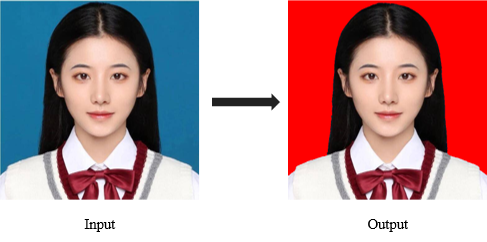

In [ ]:
# Answer your code here  | ตอบ

# Quesion 6 (5 Marks) | คำถามข้อที่ 6 (5 คะแนน)

**K-Means Segmentation and Dice Coefficient Evaluation Task (โจทย์ การแบ่งส่วนภาพด้วย K-Means และ การประเมินผลด้วย Dice Coefficient):**


Task Description: 
Perform K-Means clustering on a given image for segmentation, determine the optimal number of clusters (k) using the Elbow Method, and evaluate the segmentation quality by computing the Dice coefficient against the given ground truth mask.
> รายละเอียดโจทย์: แสดงการจัดกลุ่มแบบ K-Means โดยใช้ภาพที่กำหนดให้ โดยกำหนดจำนวนกลุ่ม (k) ที่เหมาะสม โดยใช้ Elbow Method และ ประเมินผลคุณภาพการแบ่งส่วนด้วยการคำนวณหาค่า Dice coefficient ร่วมกับ ground truth mask ที่กำหนดให้

**Instructions (คำสั่ง):**

1. Read the image **"QUESTION6_INPUT.jpg"** and apply K-Means clustering to segment the foreground and background.<span style="color: #E67E22;">(อ่านรูปภาพชื่อ **"QUESTION6_INPUT.jpg"** และ ใช้การแบ่งกลุ่มด้วย K-Means เพื่อแบ่งส่วนฉากหน้า และฉากหลังของภาพ)</span> 
2. Apply the Elbow Method to determine the optimal k-value. <span style="color: #E67E22;">(ใช้ วิธีการ Elbow Method เพื่อหาค่า k ที่เหมาะสม)</span> 
3. Convert the segmented image from kmeans into a binary mask by applying a suitable threshold. <span style="color: #E67E22;">(ทำการเปลี่ยนภาพผลลัพธ์ที่ได้จาก K-means แปลงเป็นมาสก์แบบไบนารี โดยการใช้ค่า threshold ที่เหมาะสม)</span> (Ensure the foreground is white (255) and background is black (0) for correct processing.) <span style="color: #E67E22;">(**หมายเหตุ: ตรวจสอบด้วยว่า ฉากหน้าจะถูกแสดงด้วยสีขาว และฉากหลังจะเป็นสีดำ)</span> 
4. Compute Dice Coefficient as follows formula <span style="color: #E67E22;">(คำนวณหาค่า Dice Coefficient ตามสูตรที่ได้ให้ไว้ด้านล่าง)</span> :

$$
\text{Dice} = \frac{2 \times |\text{Intersection}|}{|\text{Predicted}| + |\text{Ground Truth}|}
$$

5. Print the Dice score.（at least 0.50)<span style="color: #E67E22;">(ปริ้นแสดงคะแนนของ Dice ขั้นต่ำ 0.50)</span> 
6. Compare the predicted binary mask with the provided ground truth mask **"QUESTION6_INPUT MASK.png"**.<span style="color: #E67E22;">(เปรียบเทียบผลลัพธ์การทำนายด้วยมาสก์แบบไบนารี กับ มาสก์ ground truth mask ที่ได้กำหนดไว้ให้)</span> 


**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- Display the result for kmeans by compare the original image and the result from kmeans. <span style="color: #E67E22;">(แสดงผลลัพธ์ของ K-Means โดยเปรียบเทียบกับภาพต้นฉบับ)</span> 
- Plot the Elbow Method curve. <span style="color: #E67E22;">(แสดงกราฟ Elbow Method เพื่อตรวจหาค่า k ที่เหมาะสม)</span> 
- Print the Dice coefficient score. <span style="color: #E67E22;">(แสดงค่า Dice Coefficient เพื่อประเมินคุณภาพของการแบ่งส่วนภาพ)</span> 
- Display the original image, binary result for kmeans segmented image, and ground truth mask side by side for comparison. <span style="color: #E67E22;">(แสดงภาพต้นฉบับ, ผลลัพธ์แบบไบนารีจาก K-Means segmentation และ ground truth mask เรียงต่อกันเพื่อเปรียบเทียบ)</span> 




In [ ]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0, epsilon=1e-7):
        super().__init__()
        self.smooth = smooth
        self.epsilon = epsilon

    def forward(self, input, target):

        if input.shape != target.shape:
            input = F.softmax(input, dim=1)

        intersection = (input * target).sum(dim=[0, 2, 3])
        dice_coefficient = (2. * intersection + self.smooth) / (input.sum(dim=[0, 2, 3]) + target.sum(dim=[0, 2, 3]) + self.smooth + self.epsilon)
        dice_loss = 1. - dice_coefficient
        return dice_loss.mean()

C:\Users\computer\AppData\Local\Temp\ipykernel_6456\555585749.py:16: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(k_values, inertia, 'o-', label='Inertia', marker='o')


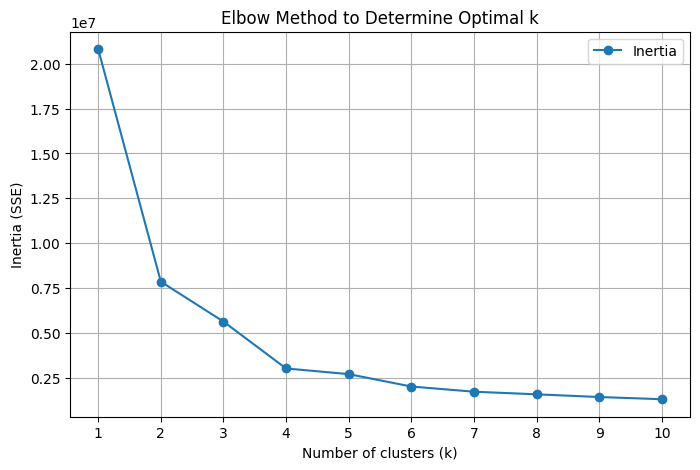

In [89]:

from sklearn.cluster import KMeans # Answer your code here | ตอบ
image = cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION6_INPUT.jpg',)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

imagespixels = image.reshape(-1, 3)  # Flatten the image into a 2D array of pixels
    # Initialize a list to store inertia values
inertia = [] # compactness
k_values = range(1, 11)  # Range of cluster numbers from 1 to 10

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(imagespixels) # Fit the KMeans model on the pixel
    inertia.append(kmeans.inertia_)  # save Inertia

plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, 'o-', label='Inertia', marker='o')
plt.title('Elbow Method to Determine Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia (SSE)')
plt.xticks(k_values)
plt.legend()
plt.grid(True)
plt.show()


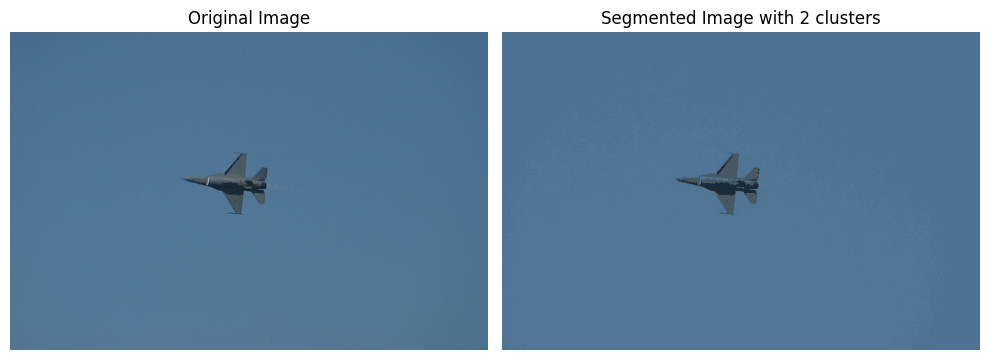

In [90]:
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=0).fit(imagespixels)

# Step 3: Map cluster centers to pixels
segmented_pixels = kmeans.cluster_centers_[kmeans.labels_]  # Replace each pixel with its cluster center
segmented_image = segmented_pixels.reshape(image.shape).astype('uint8')  # Reshape back to original image dimensions

# Step 4: Visualize the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title('Segmented Image with 2 clusters')
plt.imshow(segmented_image)
plt.axis("off")

plt.tight_layout()
plt.show()

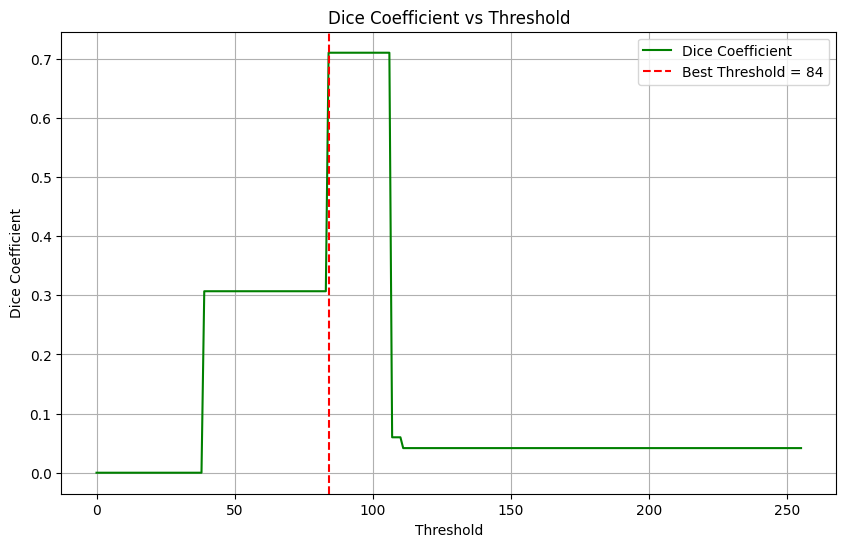

Best Threshold: 84
Maximum Dice Coefficient: 0.7099


In [98]:
ground_truth = cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION6_INPUT_MASK.png', cv2.IMREAD_GRAYSCALE)

ground_truth_resized = cv2.resize(ground_truth, (image.shape[1], image.shape[0]))  # Match input size
ground_truth_binary = (ground_truth_resized > 128).astype(np.uint8)  # Ensure binary (0 or 1)

# Step 2: Initialize variables to store best threshold and maximum Dice coefficient
best_threshold = 0
max_dice = 0
dice_values = []  # Store Dice coefficient for each threshold

# Step 3: Iterate through all threshold values (0-255)
for threshold in range(256):
    # Perform binary thresholding using OpenCV
    _, binary_image = cv2.threshold(image, threshold, 1, cv2.THRESH_BINARY_INV)  # Binary segmentation (0 or 1)

    # Calculate Dice coefficient
    intersection = np.sum(binary_image * ground_truth_binary)
    dice_coefficient = (2. * intersection) / (np.sum(binary_image) + np.sum(ground_truth_binary) + 1e-6)
    dice_values.append(dice_coefficient)  # Store Dice coefficient

    # Update best threshold if current Dice coefficient is greater
    if dice_coefficient > max_dice:
        max_dice = dice_coefficient
        best_threshold = threshold

# Step 4: Visualize the results
plt.figure(figsize=(10, 6))

# Plot Dice coefficient as a function of threshold
plt.plot(range(256), dice_values, label="Dice Coefficient", color="green")
plt.axvline(best_threshold, color="red", linestyle="--", label=f"Best Threshold = {best_threshold}")
plt.title("Dice Coefficient vs Threshold")
plt.xlabel("Threshold")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.grid()
plt.show()

# Step 5: Print the best threshold and its corresponding Dice coefficient
print(f"Best Threshold: {best_threshold}")
print(f"Maximum Dice Coefficient: {max_dice:.4f}")


Dice Coefficient: 0.7099


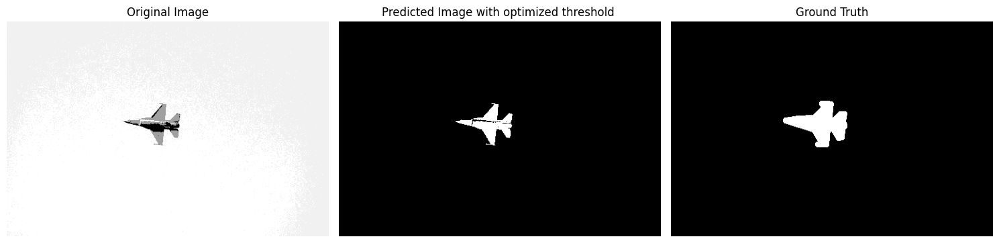

In [106]:
# Step 2: Set a threshold value and perform binary thresholding
threshold_value = 84
_, binary_image = cv2.threshold(image, threshold_value, 1, cv2.THRESH_BINARY_INV)  # Binary segmentation (0 or 1)

# Step 3: Load and preprocess the ground truth
ground_truth = cv2.imread(r"C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION6_INPUT_MASK.png", cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Resize Ground Truth to match the input image size dynamically
ground_truth_resized = cv2.resize(ground_truth, (image.shape[1], image.shape[0]))  # Match size of `image`
ground_truth_binary = (ground_truth_resized > 128).astype(np.uint8)  # Ensure binary (0 or 1)

# Step 4: Calculate Dice coefficient
intersection = np.sum(binary_image * ground_truth_binary)  # Intersection of binary and ground truth
dice_coefficient = (2. * intersection) / (np.sum(binary_image) + np.sum(ground_truth_binary))
print(f"Dice Coefficient: {dice_coefficient:.4f}")



# Step 5: Visualize the images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Predicted Image with optimized threshold ")
plt.imshow(binary_image, cmap='gray')
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Ground Truth")
plt.imshow(ground_truth_binary, cmap='gray')
plt.axis("off")

plt.tight_layout()
plt.show()


# Quesion 7 (8 Marks) | คำถามข้อที่ 7 (8 คะแนน)

**"Fill-in-the-Blank Line" Detection Task (โจทย์ ตรวจจับเส้นสำหรับเติมคำตอบในแบบฝึกหัดเติมคำ):**


Task Description: The objective of this task is to detect the horizontal blank lines in a worksheet-style image, commonly used in fill-in-the-blank exercises. 
> รายละเอียดโจทย์: เป้าหมายของแบบฝึกหัดนี้คือการตรวจจับเส้นสำหรับเติมคำตอบ ในภาพเอกสารหรือใบงานที่เป็นลักษณะแบบเติมคำในช่องว่าง (Fill-in-the-Blank)

**Instructions (คำสั่ง):**

1. Load the image **"QUESTION7_INPUT.png"** and convert it to grayscale. <span style="color: #E67E22;">(โหลดภาพชื่อ "QUESTION7_INPUT.png" และแปลงเป็นภาพระดับสีเทา)</span> 
2. Perform morphological operations to enhance horizontal lines. <span style="color: #E67E22;">(ใช้การประมวลผลเชิง morphology เพื่อเน้นเส้นแนวนอน)</span> 
3. Detect horizontal lines using the Hough Line Transform. <span style="color: #E67E22;">(ตรวจจับเส้นแนวนอนด้วย Hough Line Transform)</span> 
4. Draw the detected lines on the original image and display the results. <span style="color: #E67E22;">(วาดเส้นที่ตรวจพบทับลงบนภาพต้นฉบับ และแสดงผล)</span> 

**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- Display the original image, binary image, morphological processed image, and detected lines overlay. <span style="color: #E67E22;">(แสดงภาพต้นฉบับ, ภาพไบนารี, ภาพที่ผ่านการประมวลผลด้วย morphology และภาพที่มีการวาดเส้นที่ตรวจจับได้ทับลงไป)</span> 
- Ensure only horizontal lines corresponding to fill-in-the-blank underlines are detected.<span style="color: #E67E22;">(ตรวจจับเฉพาะเส้นแนวนอน ที่เป็นเส้นขีดเส้นใต้สำหรับเติมคำเท่านั้น)</span> 

The sample of "Final Output" are given as follows <span style="color: #E67E22;">(ตัวอย่างภาพผลลัพธ์สุดท้ายจะแสดงดังภาพด้านล่าง)</span> :


![QUESTION 7 RESULT SAMPLE PICTURE.png](<attachment:QUESTION 7 RESULT SAMPLE PICTURE.png>)

A sample of final image | ตัวอย่างผลลัพธ์
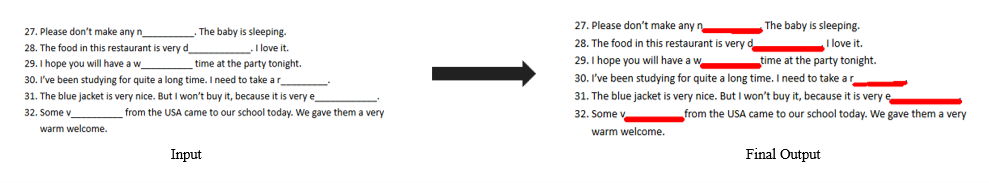

In [6]:
pip install scikit-image

   ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
   ------------- -------------------------- 4.2/12.8 MB 19.4 MB/s eta 0:00:01
   ---------------------------------------  12.6/12.8 MB 30.3 MB/s eta 0:00:01
   ---------------------------------------- 12.8/12.8 MB 27.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [41]:
import skimage
import skimage.io as io
from skimage import morphology
from skimage import measure
from skimage.draw import disk

In [13]:
blank = cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION7_INPUT.png', cv2.IMREAD_GRAYSCALE)

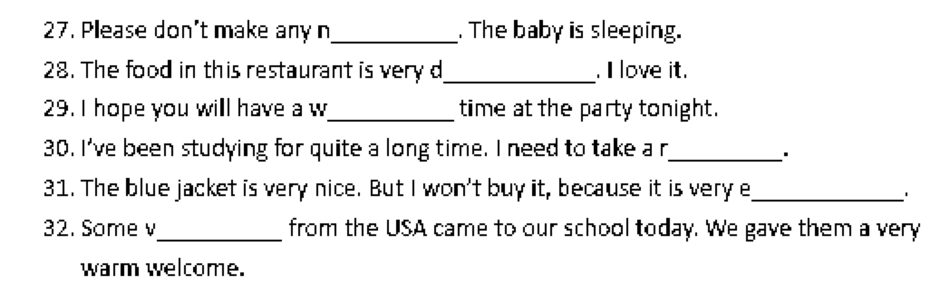

In [ ]:
# Set the threshold value
threshold_value = 150

# Perform binarization
# np.where(condition, x, y): If condition is True, returns x; if False, returns y.
binary_image = np.where(blank >= threshold_value, 255, 0).astype(np.uint8)
display_images(binary_image)




In [ ]:
#dilate, cornerharris?

In [38]:
structuring_element = np.array([
    [0, 0, 0],
    [1, 1, 1],
    [0, 0, 0],
], dtype=np.uint8)

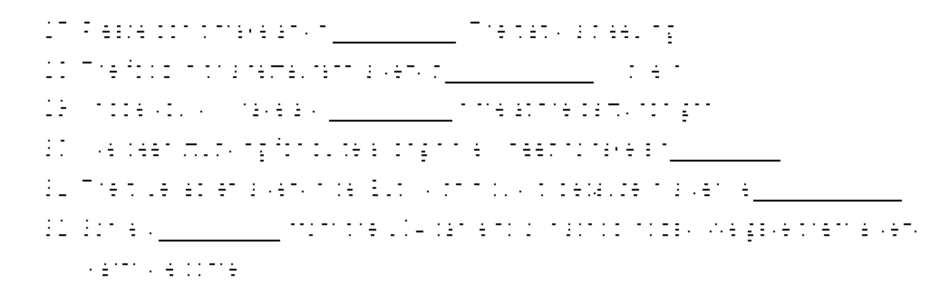

In [39]:
Diliated_image = morphology.dilation(binary_image, structuring_element)
display_images(Diliated_image)

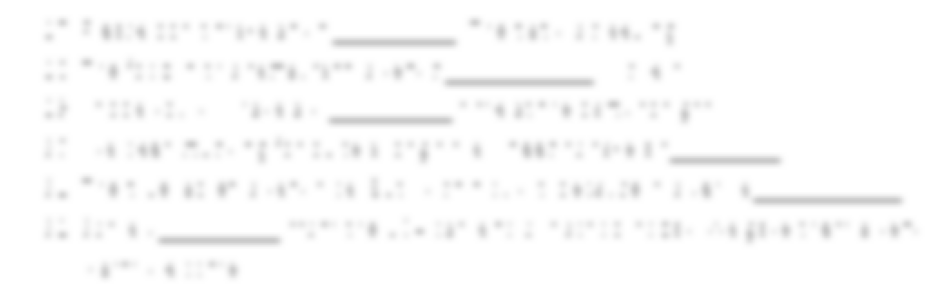

In [63]:
filtered_img = cv2.GaussianBlur(Diliated_image, (9, 9), 1.9)
display_images(filtered_img)

C:\Users\computer\AppData\Local\Temp\ipykernel_6456\747247732.py:64: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


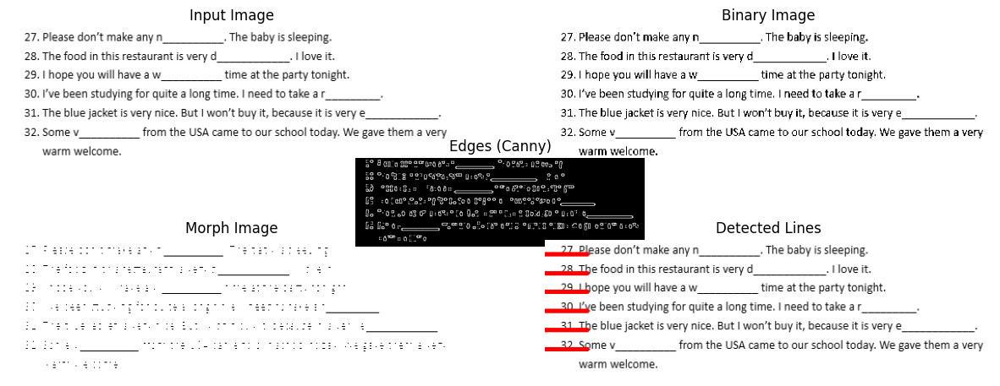

In [81]:
image = cv2.imread(r'C:\Users\computer\Downloads\FINAL_LAB_EXAM_OF_IMnCV_(CP412005)\QUESTION7_INPUT.png', cv2.IMREAD_GRAYSCALE)

structuring_element = np.array([
    [0, 0, 0],
    [1, 1, 1],
    [0, 0, 0],
    
], dtype=np.uint8)

threshold_value = 150
binary_image = np.where(image >= threshold_value, 255, 0).astype(np.uint8)
Diliated_image = morphology.dilation(binary_image, structuring_element)


filtered_img = cv2.GaussianBlur(Diliated_image, (9, 9), 1.9)

edges = cv2.Canny(filtered_img, threshold1=30, threshold2=30, apertureSize=3)

lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=131)

# Step 3: Draw the detected lines on the original image
output_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR

if lines is not None:
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 50 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 50 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(output_image, (x1, y1), (x2, y2), (0, 0, 255), 3)


plt.figure(figsize=(15, 6))
plt.subplot(2, 2, 1)
plt.title("Input Image")
plt.imshow(image, cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 2)
plt.title("Binary Image")
plt.imshow(binary_image,cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 3)
plt.title("Morph Image")
plt.imshow(Diliated_image, cmap='gray')
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Edges (Canny)")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 4)
plt.title("Detected Lines")
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()

# Quesion 8 (8 Marks) | คำถามข้อที่ 8 (8 คะแนน)

**Deep Learning Classification Task (โจทย์ การจำแนกประเภทขยะด้วย Deep Learning):**


Task Description: Implement and train a deep learning model for garbage classification using the given model architecture shown in the diagram. Evaluate its performance on the dataset and visualize the results.
> รายละเอียดโจทย์: ให้เขียนโปรแกรมเพื่อสร้างและฝึกโมเดล Deep Learning สำหรับ จำแนกประเภทขยะ โดยใช้สถาปัตยกรรมของโมเดลที่ให้มาเป็นภาพด้านล่าง และประเมินผลการทำงานของโมเดลจากชุดข้อมูลที่กำหนด พร้อมทั้งแสดงผลลัพธ์

**Instructions (คำสั่ง):**

1. Write the PyTorch implementation of the given model architecture including SE Blocks. <span style="color: #E67E22;">(เขียนโค้ดโดยใช้ PyTorch เพื่อสร้างสถาปัตยกรรมของโมเดลที่ประกอบด้วย SE Block ตามที่แสดงในแผนภาพ)</span>
2. Load and preprocess the **garbage classification dataset** and split them into training and validation dataset, 80% and 20% respectively. <span style="color: #E67E22;">(โหลดและเตรียมข้อมูล ชุดข้อมูลการจำแนกประเภทขยะ และแยกข้อมูลเป็น: 80% สำหรับฝึก, 20% สำหรับทดสอบ)</span> 
3. Train the model with a suitable loss function and an appropriate optimizer. <span style="color: #E67E22;">(ฝึกโมเดลด้วย loss function ที่เหมาะสม และ optimizer ที่เหมาะสม)</span> 
4. Train for at least 5 epochs and track training loss, validation loss, and accuracy.[Note: The Accuracy should be at least 50%]<span style="color: #E67E22;">(ฝึกโมเดลอย่างน้อย 5 epoch และติดตามผล training loss, validation loss, and accuracy) **หมายเหตุ: ความแม่นยำควรมากกว่าอย่างน้อย 50%</span> 
5. Display the training and validation loss curves. <span style="color: #E67E22;">(แสดงกราฟ training และ validation loss)</span> 
6. Display the training and validation accuracy curves. <span style="color: #E67E22;">(แสดงกราฟ training และ validation accuracy)</span> 
7. Select sample images and visualize their predicted vs. actual class labels. <span style="color: #E67E22;">(เลือกภาพบางส่วนจากตัวอย่างชุดทดสอบ เพื่อแสดงผลการทำนายเทียบกับคำตอบจริง)</span> 


**Notation Guide [for interpreting the network diagram] (คำอธิบายสัญลักษณ์ของสถาปัตยกรรม):**
- 7x7 conv, 64, 2, 3 refers to a convolution layer with:

    - kernel size = 7

    - number of output channels = 64

    - stride = 2

    - padding = 3

- Unless otherwise specified, the default values are (ถ้ามีตัวแปรที่ไม่ได้ระบุไว้ หมายถึง):

    - stride = 1

    - padding = 1




**Deliverables | ผลลัพธ์ที่ต้องแสดง:**
- Submit the fully implemented PyTorch model with the given architecture. <span style="color: #E67E22;">(แสดงโค้ดการสร้างโมเดลด้วย PyTorch ตามรูปแบบสถาปัตยกรรมที่กำหนด)</span> 
- Provide training and validation accuracy/loss plots. <span style="color: #E67E22;">(แสดงกราฟ
[Training และ Validation Loss] กับ [Training และ Validation Accuracy])</span> 
- Display a comparison of predicted vs. actual class labels for randomly selected test samples. <span style="color: #E67E22;">(แสดงภาพสุ่มตัวอย่างจากชุดทดสอบ พร้อมเทียบผลการทำนายเทียบกับคำตอบจริง)</span> 


![QUESTION 8 MODEL ARCHITECTURE PICTURE.png](<attachment:QUESTION 8 MODEL ARCHITECTURE PICTURE.png>)
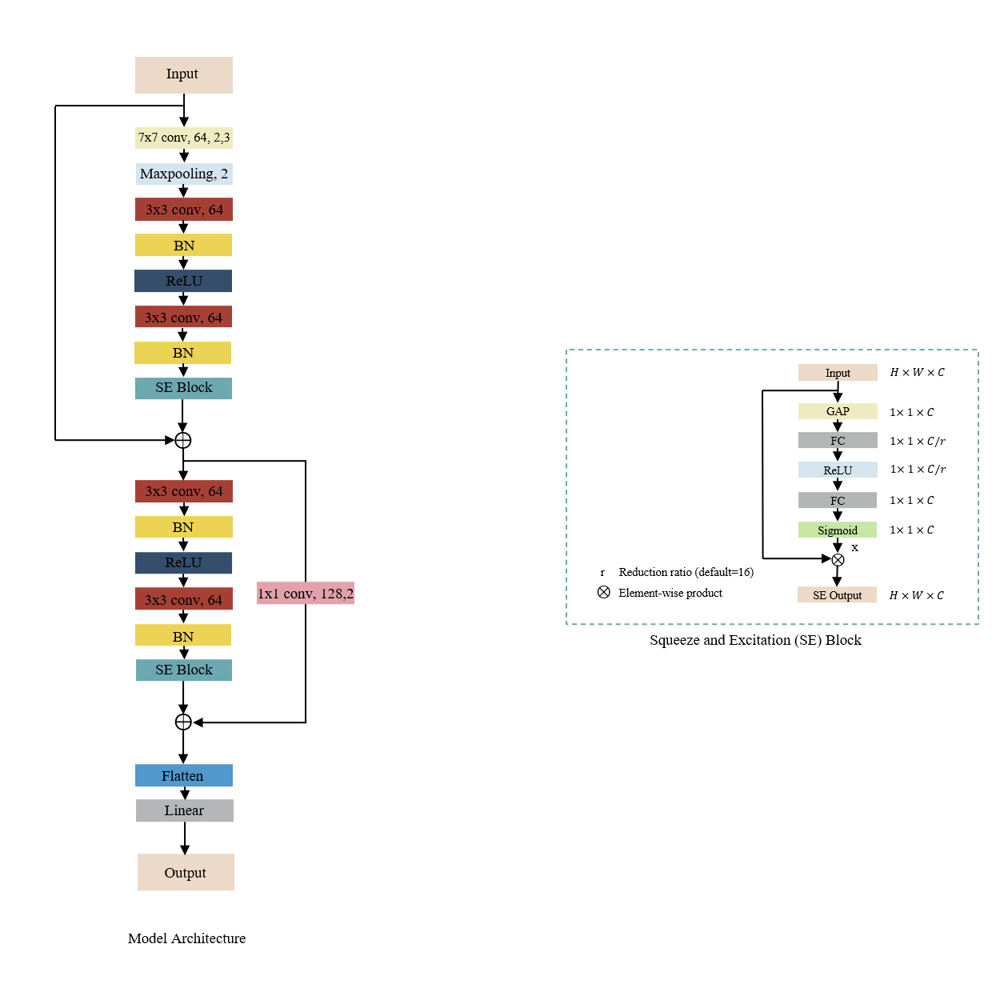

In [ ]:
# Answer your code here | ตอบ